# Problema 1

In [1]:
import os

import numpy as np
from PIL import Image
from matplotlib import pyplot as plt


def open_images():
    list_img = []
    list_filenames = []
    for filename in os.listdir('images'):
        img = Image.open('images/' + filename)
        list_img.append(img)
        list_filenames.append(filename)

    return list_img, list_filenames


Precision: 1.0
Recall: 0.9166666666666666
Precision negative: 0.9090909090909091
Recall negative: 1.0
Accuracy: 0.9545454545454546


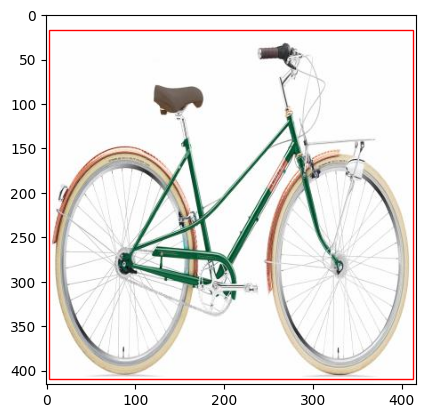

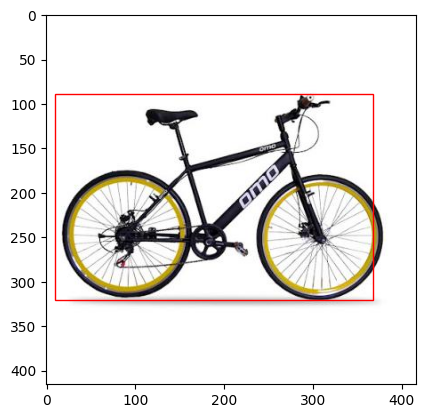

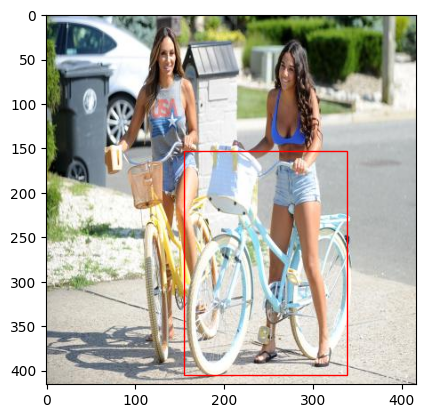

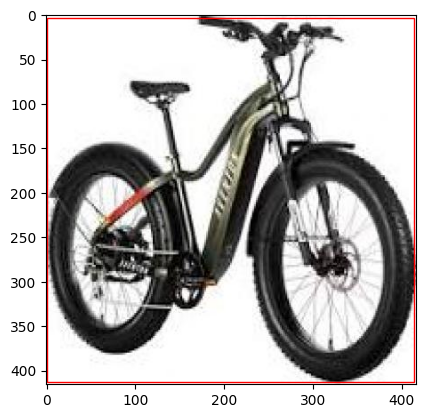

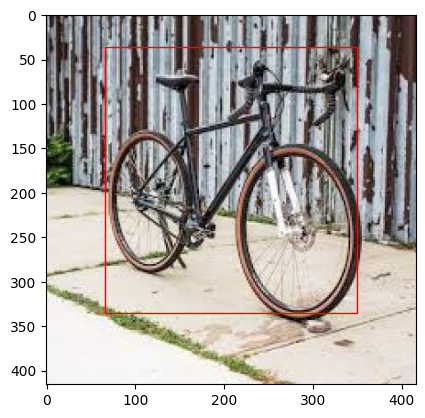

...

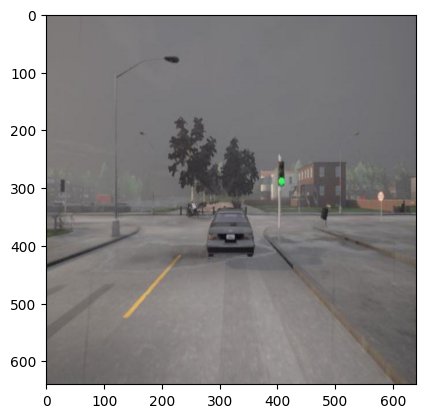

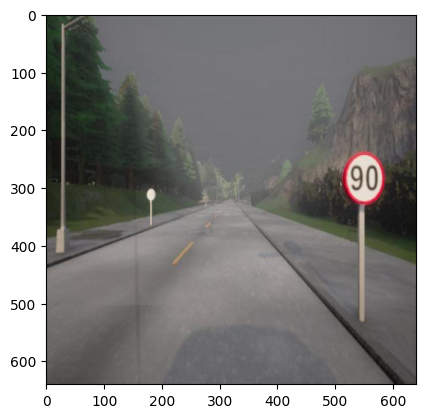

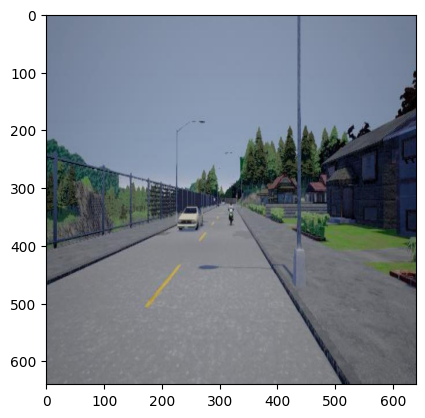

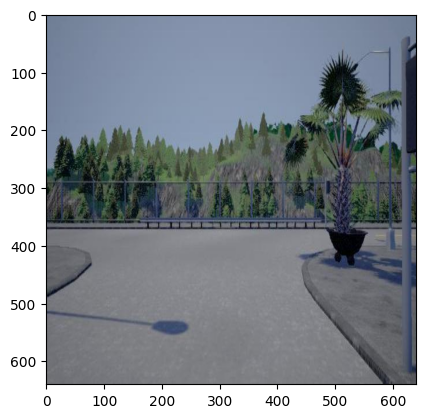

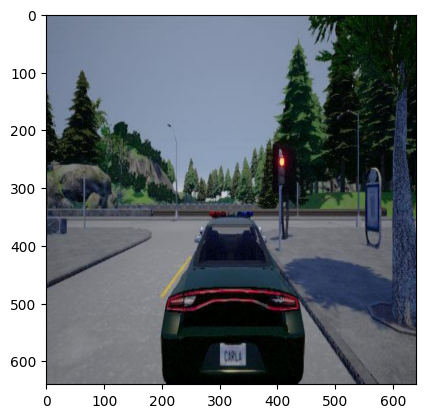

In [2]:

import io

from azure.cognitiveservices.vision.computervision import ComputerVisionClient
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes
from msrest.authentication import CognitiveServicesCredentials

'''
Authenticate
Authenticates your credentials and creates a client.
'''
# subscription_key = os.environ["VISION_KEY"]
subscription_key = ""
# endpoint = os.environ["VISION_ENDPOINT"]
endpoint = ""
computervision_client = ComputerVisionClient(endpoint, CognitiveServicesCredentials(subscription_key))
'''
END - Authenticate
'''


def get_response(img):
    return computervision_client.analyze_image_in_stream(img, visual_features=[VisualFeatureTypes.tags,
                                                                               VisualFeatureTypes.objects])


list_images, list_filenames = open_images()


def get_image_as_byte_stream(image):
    byte_stream = io.BytesIO()
    image.save(byte_stream, format='JPEG')
    byte_stream.seek(0)

    return byte_stream


def get_responses():
    list_ = []
    for img in list_images:
        img1 = get_image_as_byte_stream(img)
        response = get_response(img1)
        list_.append(response)

    return list_


list_responses = get_responses()


def compute_performance_all_images():
    true_positives = 0
    true_negatives = 0
    false_positives = 0
    false_negatives = 0

    for img, filename, response in zip(list_images, list_filenames, list_responses):
        bike_detected = False
        for obj in response.objects:
            if obj.object_property == 'bicycle' or obj.object_property == 'bike' or obj.object_property == 'cycle':
                bike_detected = True
                if 'bike' in filename:
                    true_positives += 1
                else:
                    false_positives += 1

        if not bike_detected:
            if 'bike' in filename:
                false_negatives += 1
            else:
                true_negatives += 1

    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    precision_neg = true_negatives / (true_negatives + false_negatives)
    recall_neg = true_negatives / (true_negatives + false_positives)
    accuracy = (true_positives + true_negatives) / (true_positives + true_negatives + false_positives + false_negatives)

    return precision, recall, precision_neg, recall_neg, accuracy


def print_performance():
    performance = compute_performance_all_images()
    print('Precision:', performance[0])
    print('Recall:', performance[1])
    print('Precision negative:', performance[2])
    print('Recall negative:', performance[3])
    print('Accuracy:', performance[4])


def draw_boxes():
    for img, response in zip(list_images, list_responses):
        plt.imshow(img)
        for obj in response.objects:
            if obj.object_property == 'bicycle' or obj.object_property == 'bike' or obj.object_property == 'cycle':
                plt.gca().add_patch(
                    plt.Rectangle((obj.rectangle.x, obj.rectangle.y), obj.rectangle.w, obj.rectangle.h, fill=False,
                                  edgecolor='r', lw=1))
        plt.show()


print_performance()
draw_boxes()

In [3]:
print(len(list_images))

22


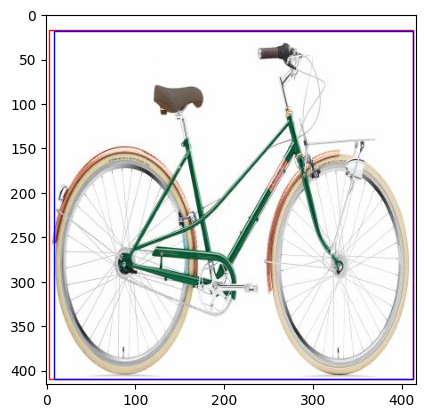

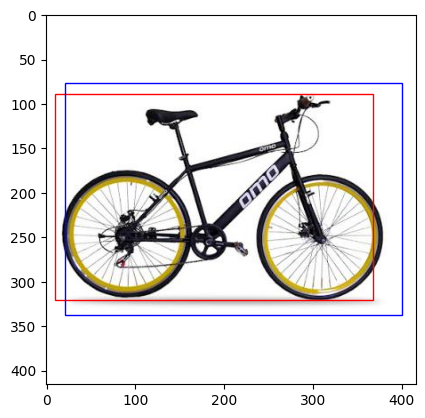

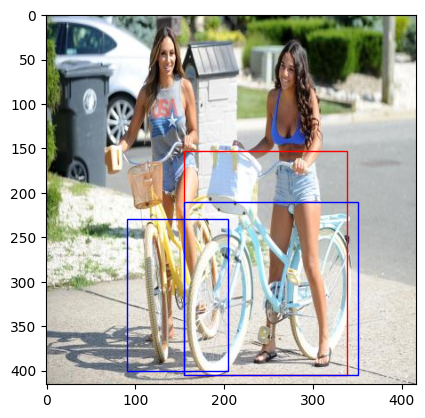

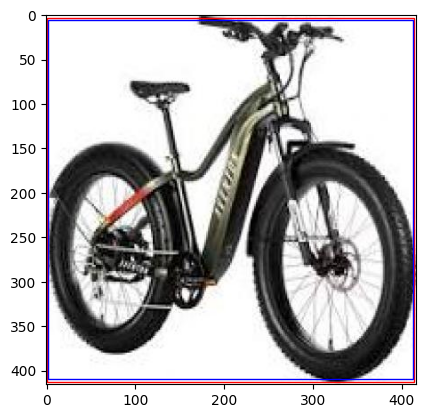

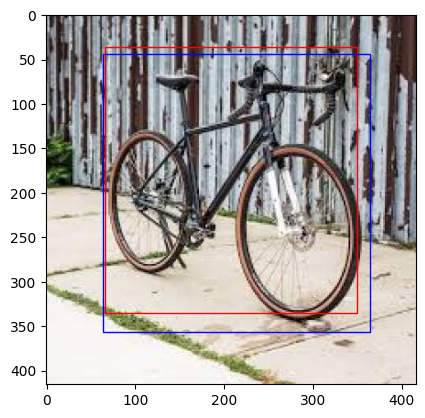

...

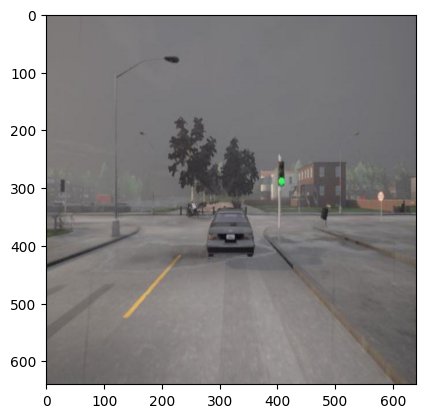

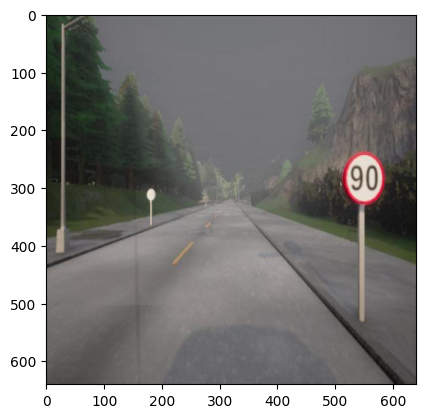

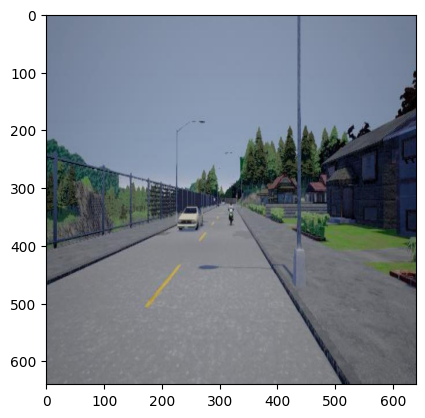

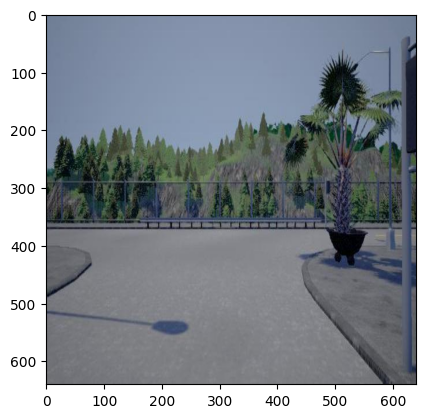

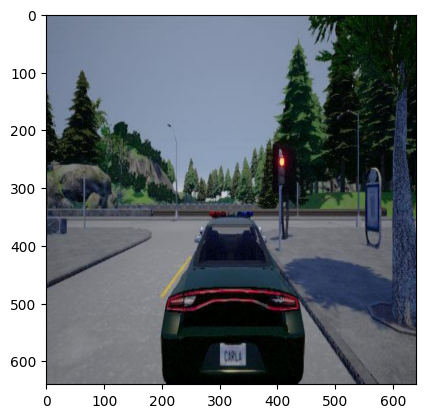

In [4]:
coords = [[8, 18, 412, 410], [21, 76, 400, 338], [[155, 210, 351, 405], [91, 229, 204, 400]], [2, 5, 412, 409],
          [63, 44, 364, 357],
          [[155, 210, 351, 405], [91, 229, 204, 400]], [63, 236, 320, 415], [38, 35, 405, 359], [8, 27, 391, 390],
          [140, 127, 379, 404], [42, 41, 948, 760], [72, 16, 223, 152]] + [None] * (len(list_images) - 12)

list_IoU_values = []


def compute_IoU(g, c):
    aarea = abs(g[2] - g[0]) * abs(g[3] - g[1])
    barea = abs(c[2] - c[0]) * abs(c[3] - c[1])

    ix = max(0, min(g[2], c[2]) - max(g[0], c[0]))
    iy = max(0, min(g[3], c[3]) - max(g[1], c[1]))

    iarea = ix * iy

    uarea = aarea + barea - iarea

    return iarea / uarea


def draw_ground_boxes(c):
    plt.gca().add_patch(
        plt.Rectangle((c[0], c[1]), c[2] - c[0], c[3] - c[1], fill=False, edgecolor='b',
                      lw=1))


def add_result(rectangle, c, result):
    result.append(compute_IoU(
        (rectangle.x, rectangle.y, rectangle.x + rectangle.w,
         rectangle.y + rectangle.h), c))


def get_iou(rectangle, coord):
    result = []
    if coord is None:
        return [0]
    if isinstance(coord[0], int):
        draw_ground_boxes(coord)
        add_result(rectangle, coord, result)
    else:
        for c in coord:
            draw_ground_boxes(c)
            add_result(rectangle, c, result)

    return result


def draw_boxes2():
    for img, response, coord in zip(list_images, list_responses, coords):
        plt.imshow(img)
        bike = False
        for obj in response.objects:
            if obj.object_property == 'bicycle' or obj.object_property == 'bike' or obj.object_property == 'cycle':
                bike = True
                plt.gca().add_patch(
                    plt.Rectangle((obj.rectangle.x, obj.rectangle.y), obj.rectangle.w, obj.rectangle.h, fill=False,
                                  edgecolor='r', lw=1))
                list_IoU_values.extend(get_iou(obj.rectangle, coord))
        if not bike:
            if coord is not None:
                if isinstance(coord[0], int):
                    draw_ground_boxes(coord)
                    list_IoU_values.append(0)
                else:
                    for c in coord:
                        draw_ground_boxes(c)
                        list_IoU_values.append(0)

        plt.show()


draw_boxes2()

0.9852616385773033
0.7863482298544308
0.7334895480051797
0.14684542586750787
0.9758454106280193
0.8536024130103548
0.6822758136267852
0.17829389526743208
0.7814783135535835
0
0.8804792323729085
0.9153307326518408
0.8667135932710813
0.7501407393507225


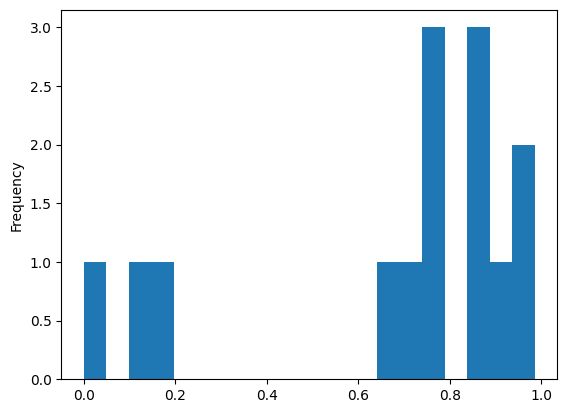

count    14.000000
mean      0.681150
std       0.324514
min       0.000000
25%       0.695079
50%       0.783913
75%       0.877038
max       0.985262
Name: IoU, dtype: float64

In [5]:
import pandas as pd

print(*list_IoU_values, sep='\n')
df = pd.DataFrame(list_IoU_values, columns=['IoU'])
df['IoU'].plot(kind='hist', bins=20)
plt.show()
df['IoU'].describe()

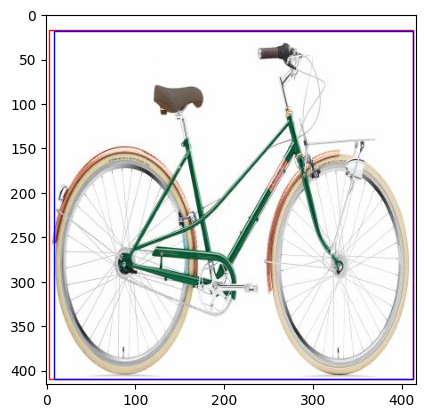

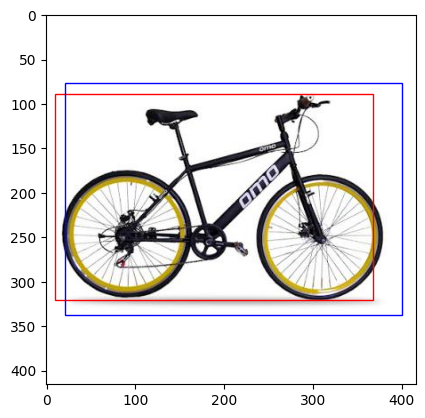

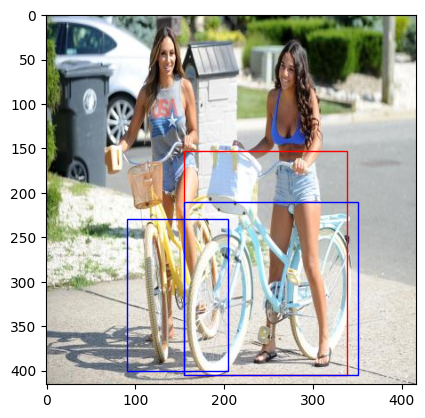

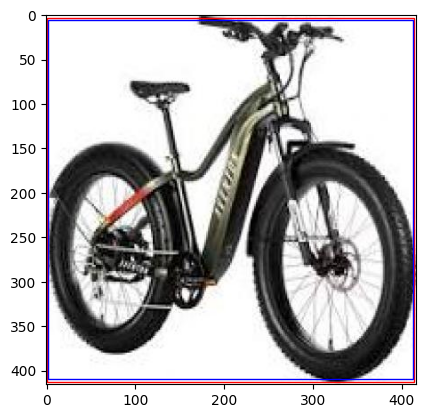

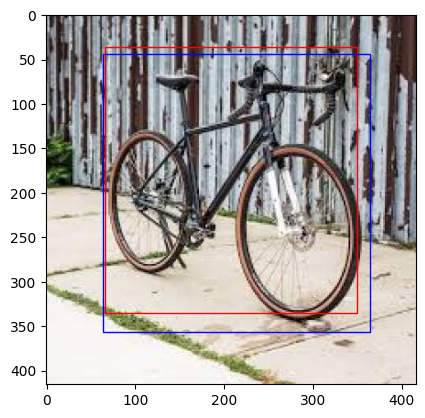

...

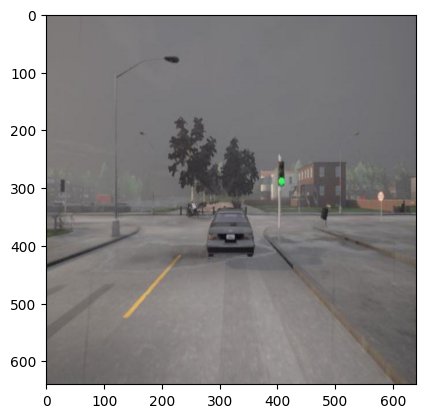

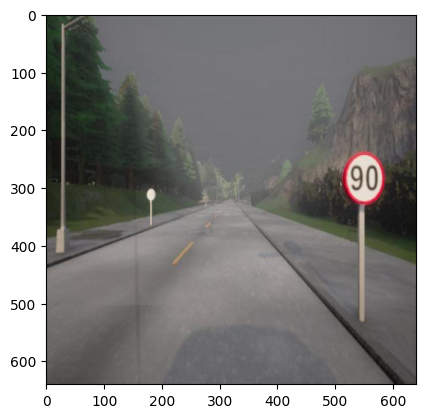

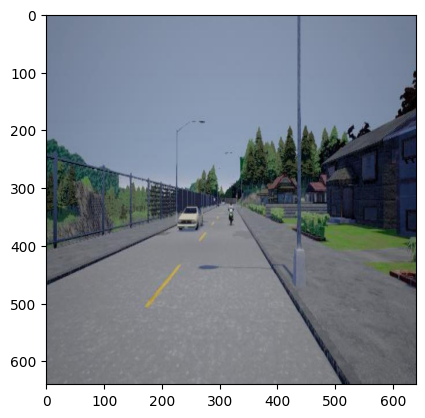

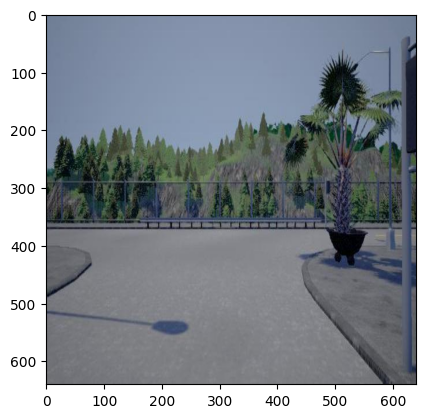

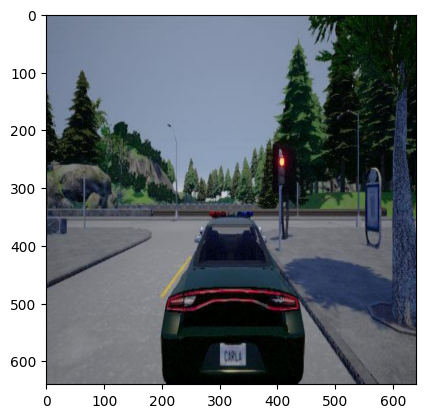

Mean average precision: 0.7954545454545454


In [6]:
def compute_performance_image(list_iou, number_ground_truth):
    from sklearn.metrics import auc
    detected_bikes = len(list_iou) // number_ground_truth if number_ground_truth != 0 else 0
    for threshold in np.linspace(0, 1, 100):
        tp = sum([1 for i in list_iou if i >= threshold])
        fp = detected_bikes - tp
        fn = number_ground_truth - tp

        if tp + fp == 0:
            precision_value = 0
            recall_value = 0
        else:
            precision_value = tp / (tp + fp)
            recall_value = tp / (tp + fn)

        precision.append(precision_value)
        recall.append(recall_value)

    precision.sort(reverse=True)
    recall.sort()
    ap = auc(recall, precision)
    ap_values.append(ap)


precision = []
recall = []
ap_values = []


def draw_boxes3():
    for img, response, coord in zip(list_images, list_responses, coords):
        plt.imshow(img)
        bike = False
        img_iou = []
        for obj in response.objects:
            if obj.object_property == 'bicycle' or obj.object_property == 'bike' or obj.object_property == 'cycle':
                bike = True
                plt.gca().add_patch(
                    plt.Rectangle((obj.rectangle.x, obj.rectangle.y), obj.rectangle.w, obj.rectangle.h, fill=False,
                                  edgecolor='r', lw=1))
                img_iou.extend(get_iou(obj.rectangle, coord))

        if not bike:
            if coord is not None:
                if isinstance(coord[0], int):
                    draw_ground_boxes(coord)
                    img_iou.append(0)
                else:
                    for c in coord:
                        draw_ground_boxes(c)
                        img_iou.append(0)
        if coord is None:
            number_ground_truth = 0
        else:
            number_ground_truth = 1 if isinstance(coord[0], int) else len(coord)
        compute_performance_image(img_iou, number_ground_truth)
        plt.show()


def print_map():
    print("Mean average precision: {}".format(np.mean(ap_values)))


draw_boxes3()
print_map()